<a href="https://colab.research.google.com/github/tol/CSAPP2e/blob/master/Very_quick_intro_to_TensorFlow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Very quick intro to TensorFlow

Link to this colab: <font size="20">[goo.gl/QfpwVN](https://goo.gl/QfpwVN)</font>


In [0]:
#@title Pyton Imports

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# for animated plots
from matplotlib import animation, rc
from IPython.display import HTML

print "tf.VERSION", tf.VERSION
print "tf.keras.__version__", tf.keras.__version__

tf.VERSION 1.13.1
tf.keras.__version__ 2.2.4-tf


In [0]:
#@title Library for displaying tensorflow graph: show_graph(graph)

from IPython.display import clear_output, Image, display, HTML
import tensorflow as tf
import numpy as np
from google.colab import files

def strip_consts(graph_def, max_const_size=32):
    """Strip large constant values from graph_def."""
    strip_def = tf.GraphDef()
    for n0 in graph_def.node:
        n = strip_def.node.add() 
        n.MergeFrom(n0)
        if n.op == 'Const':
            tensor = n.attr['value'].tensor
            size = len(tensor.tensor_content)
            if size > max_const_size:
                tensor.tensor_content = "<stripped %d bytes>"%size
    return strip_def

def show_graph(graph_def, max_const_size=32):
    """Visualize TensorFlow graph."""
    if hasattr(graph_def, 'as_graph_def'):
        graph_def = graph_def.as_graph_def()
    strip_def = strip_consts(graph_def, max_const_size=max_const_size)
    code = """
        <script>
          function load() {{
            document.getElementById("{id}").pbtxt = {data};
          }}
        </script>
        <link rel="import" href="https://tensorboard.appspot.com/tf-graph-basic.build.html" onload=load()>
        <div style="height:600px">
          <tf-graph-basic id="{id}"></tf-graph-basic>
        </div>
    """.format(data=repr(str(strip_def)), id='graph'+str(np.random.rand()))

    iframe = """
        <iframe seamless style="width:1200px;height:620px;border:0" srcdoc="{}"></iframe>
    """.format(code.replace('"', '&quot;'))
    display(HTML(iframe))

In [0]:
#@title Build the graph

g = tf.Graph()
with g.as_default():
  x = tf.placeholder(tf.float32, name='my_x')
  y = x ** 4 - x + 5
  y = tf.identity(y, name='my_y')
  
show_graph(g)

In [0]:
#@title Execute the graph in a session

sess = tf.Session(graph=g)

print 'sess.run(x)   ', sess.run(x, feed_dict={x: 2})
print 'sess.run(pow) ', sess.run('pow:0', feed_dict={x: 2})
print 'sess.run(sub) ', sess.run('sub:0', feed_dict={x: 2})
print 'sess.run(y)   ', sess.run(y, feed_dict={x: 2})


sess.run(x)    2.0
sess.run(pow)  16.0
sess.run(sub)  14.0
sess.run(y)    19.0


In [0]:
#@title Tensors can be multi dimensional

g = tf.Graph()
with g.as_default():
  a = tf.constant([[1., 2.], 
                   [3., 4.]])
  b = tf.constant([[5., 6.], 
                   [7., 8.]])
  
  c = a + b
  d = tf.matmul(a, b)
  
sess = tf.Session(graph=g)
with sess.as_default():
  print "c", sess.run(c)
  print "d", sess.run(d)

c [[ 6.  8.]
 [10. 12.]]
d [[19. 22.]
 [43. 50.]]


In [0]:
#@title Sessions can have state

g = tf.Graph()
with g.as_default():
  x = tf.get_variable(name="my_x", shape=(), dtype=tf.float32,
                      initializer=tf.constant_initializer(0.0))  
  y = tf.get_variable(name="my_y", shape=(), dtype=tf.float32,
                    initializer=tf.constant_initializer(0.0))
  z = tf.get_variable(name="my_z", shape=(), dtype=tf.float32,
                      initializer=tf.constant_initializer(0.0))  
  
  x_assign_add_1 = x.assign_add(1.0)  # write result back to x
  y = y + 1                           # `my_y` tf var is not modified
  z_plus_1 = z + 1                    # same here
  
  init = tf.global_variables_initializer()
  sess = tf.Session()

sess.run(init)

print "sess.run(x)              ", sess.run(x)
print "sess.run(x_assign_add_1) ", sess.run(x_assign_add_1)
print "sess.run(x)              ", sess.run(x)
print "sess.run(x_assign_add_1) ", sess.run(x_assign_add_1)
print "sess.run(x)              ", sess.run(x)
print
print "sess.run(y)              ", sess.run(y)
print "sess.run(y)              ", sess.run(y)
print
print "sess.run(z)              ", sess.run(z)
print "sess.run(z_plus_1)       ", sess.run(z_plus_1)
print "sess.run(z)              ", sess.run(z)

show_graph(g)

sess.run(x)               0.0
sess.run(x_assign_add_1)  1.0
sess.run(x)               1.0
sess.run(x_assign_add_1)  2.0
sess.run(x)               2.0

sess.run(y)               1.0
sess.run(y)               1.0

sess.run(z)               0.0
sess.run(z_plus_1)        1.0
sess.run(z)               0.0


# Gradient Descent

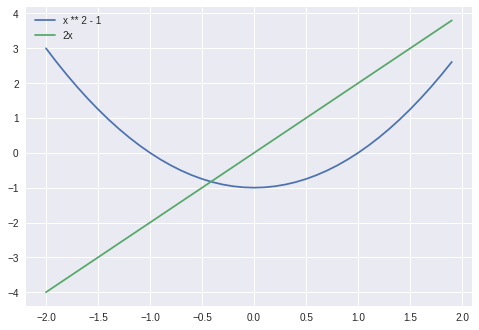

In [0]:
#@title Calculating derivative with TF

#@title Build the graph

g = tf.Graph()
with g.as_default():
  x = tf.placeholder(tf.float32)
  y = x ** 2 - 1
  
  y_dt_x = tf.gradients(ys=[y], xs=[x])[0]

sess = tf.Session(graph=g)

# variables do not need to be just scalars
evaluate_x_at = np.arange(-2, 2, 0.1)

plt.plot(evaluate_x_at, sess.run(y, feed_dict={x: evaluate_x_at}))
plt.plot(evaluate_x_at, sess.run(y_dt_x, feed_dict={x: evaluate_x_at}))
plt.legend(["x ** 2 - 1", "2x"])

None

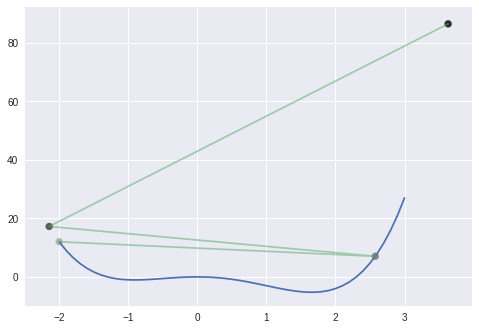

In [0]:
#@title Finding minimum of a function { run: "auto" }

initial_x = -2 #@param {type:"slider", min:-2, max:3, step:0.1}
learning_rate = 0.143  #@param {type:"slider", min:0.001, max:0.143, step:0.001}
num_steps = 3 #@param {type:"slider", min:1, max:40, step:1}

#Interesting points:

# Divergence
# initial_x, learning_rate, num_steps = 2.4, 0.18, 3

# Saddle point
# initial_x, learning_rate, num_steps = 0, 0.2, 40
# initial_x, learning_rate, num_steps = 0.0001, 0.1, 40

g = tf.Graph()
with g.as_default():
  x = tf.get_variable(
      name="x", 
      shape=(), 
      dtype=tf.float32,
      initializer=tf.constant_initializer(initial_x))  
  y = x ** 4 - x ** 3 - 3 * x ** 2
  
  optimizer = tf.train.GradientDescentOptimizer(
      learning_rate=learning_rate)
  training_step = optimizer.minimize(y)
  
  init = tf.global_variables_initializer()
  sess = tf.Session()

sess.run(init)

results = []
for i in xrange(num_steps + 1):
  results.append(sess.run({x: x, y: y}))
  sess.run(training_step)

# Visualize the steps. Not as important
xes = np.arange(-2, 3.1, 0.1)
plt.plot(
    xes,
    [sess.run(y, feed_dict={x: i}) for i in np.arange(-2, 3.1, 0.1)]
)  
plt.plot(
    [v[x] for v in results],
    [v[y] for v in results],
    alpha=0.5
)

def color_at_step(i):
  i = 0.7 - float(i) / len(results) * 0.7
  return (i, i, i, 1.0)

plt.scatter(
    [v[x] for v in results],
    [v[y] for v in results],    
    color = [color_at_step(i) for i in xrange(len(results))]
)

None


**Excersises:**

Try uncommenting other interesting parameters:
- Divergence 
 - `initial_x, learning_rate, num_steps =   2.4, 0.18, 3`
- Saddle point 
  - `initial_x, learning_rate, num_steps =   0.0,  0.2, 40`
- Almost saddle point
  - `initial_x, learning_rate, num_steps = 0.0001, 0.1, 40`

learning_rate 0.001


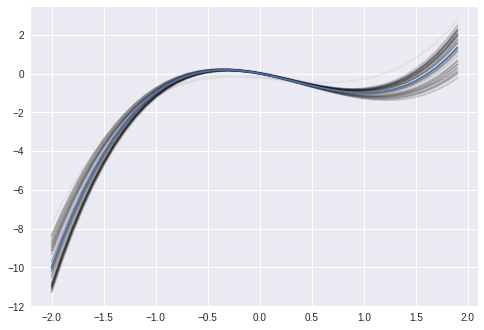

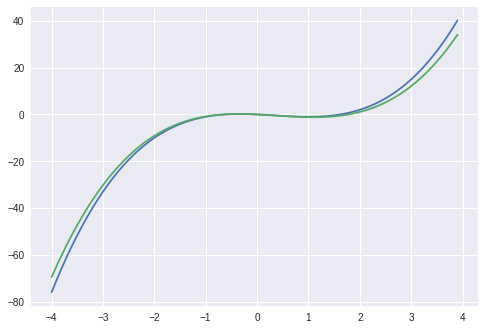

In [0]:
#@title Finding a function to match points { run: "auto" }

log_learning_rate = -3  #@param {type:"slider", min:-5, max:0, step:0.1}
learning_rate = 10 ** log_learning_rate
print "learning_rate", learning_rate

g = tf.Graph()
with g.as_default():
  x = tf.placeholder(name="x", dtype=tf.float32)
  
  w = tf.get_variable(
      name="w",
      shape=(4), 
      dtype=tf.float32)
  
  y = (w[0]
       + w[1] * x
       + w[2] * x ** 2 
       + w[3] * x ** 3
      )
  
  label = tf.placeholder(name="label", dtype=tf.float32)
  loss = tf.abs(y - label)
  
  training_step = tf.train.GradientDescentOptimizer(
      learning_rate=learning_rate).minimize(loss)
  
  init = tf.global_variables_initializer()
  sess = tf.Session()

sess.run(init)

def ground_truth_function(x):
  return x ** 3 - x ** 2 - x


eval_at_x = np.arange(-2, 2, 0.1)

for i in xrange(50):
  c = 0.7 - i / float(50) * 0.7
  plt.plot(
      eval_at_x,
      sess.run(y, feed_dict={x: eval_at_x}),
      color=(c, c, c, 0.2),
  )
  for j in xrange(10):
    xes = np.random.random(100) * 4 - 2
    labels = ground_truth_function(xes)
    sess.run(training_step, {x: xes, label: labels})

plt.plot(
    eval_at_x,
    ground_truth_function(eval_at_x)
)

plt.show()

# Plot how the function behave outside of the training samples
eval_at_x = np.arange(-4, 4, 0.1)
plt.plot(
    eval_at_x,
    ground_truth_function(eval_at_x)
)
# Plot the predictions
plt.plot(
    eval_at_x,
    sess.run(y, feed_dict={x: eval_at_x})
)


**Question: ** what would happen if the model had less parameters (E.g. 2 or 3 instead of 4)?

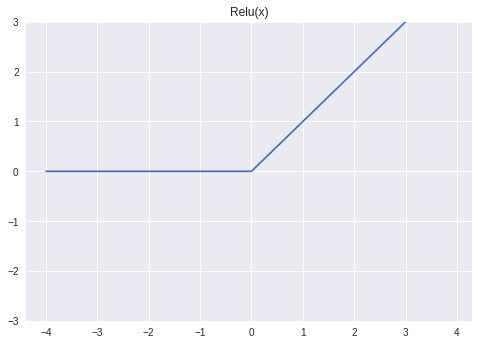

In [0]:
#@title ReLU

def Relu(x):
  return (x > 0) * x

x = np.arange(-4, 4, 0.1)

y = Relu(x)
plt.title("Relu(x)")
plt.plot(x, y)
plt.ylim(-3, 3)

None

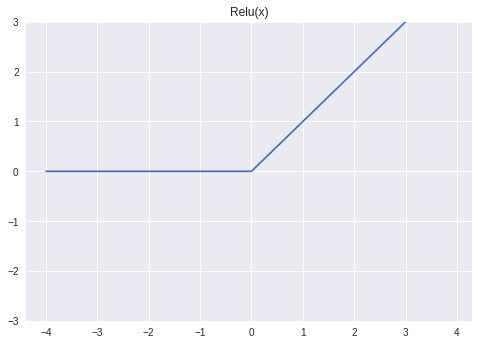

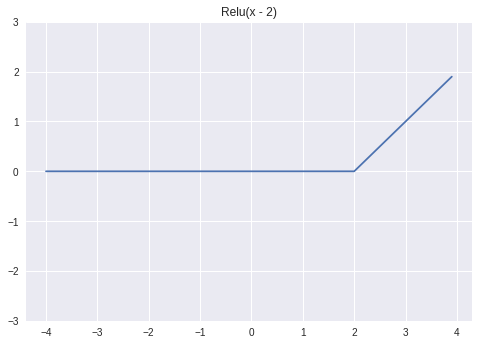

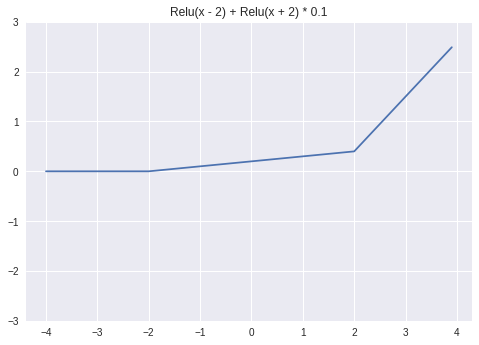

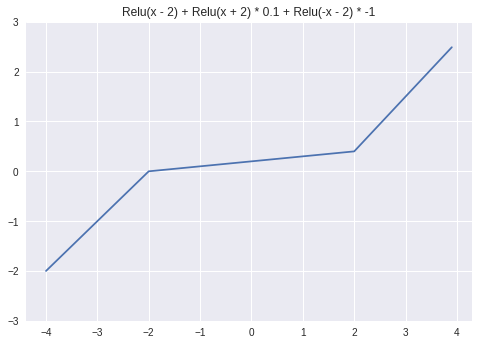

In [0]:
#@title ReLU - Example

x = np.arange(-4, 4, 0.1)

y = Relu(x)
plt.title("Relu(x)")
plt.plot(x, y)
plt.ylim(-3, 3)
plt.show()

y = Relu(x - 2)
plt.title("Relu(x - 2)")
plt.plot(x, y)
plt.ylim(-3, 3)
plt.show()

y = Relu(x - 2) + Relu(x + 2) * 0.1
plt.title("Relu(x - 2) + Relu(x + 2) * 0.1")
plt.plot(x, y)
plt.ylim(-3, 3)
plt.show()

y = Relu(x - 2) + Relu(x + 2) * 0.1 + Relu(-x - 2) * -1
plt.title("Relu(x - 2) + Relu(x + 2) * 0.1 + Relu(-x - 2) * -1")
plt.plot(x, y)
plt.ylim(-3, 3)
plt.show()

None

In [0]:
#@title Animated fully connected layer

def GetPointsOnGrid():
  points = np.arange(-1.0, 1.1, 0.2)
  n = len(points)
  points = np.expand_dims(points, -1)
  points_x = np.concatenate([points, np.zeros_like(points)], axis=1)
  points_y = points_x[:,[1, 0]]
  points = np.expand_dims(points_x, 0) + np.expand_dims(points_y, 1)
  points = points.reshape([-1, 2])
  return points

mats = np.array([
    [[1, 0], [0, 1]],
    
    [[2, 0], [0, 0.5]],
    [[1, 0], [0, 1]],
    
    [[0.5, 0.5], [0, 1]],
    [[1, 0], [0, 1]],
    
    [[0.5, 0.5], [-0.5, 0.5]],
    [[1, 0], [0, 1]],           
]).astype(np.float32)

biases = np.concatenate([
    np.zeros([mats.shape[0], 2]),
    np.random.random([mats.shape[0], 2]) * 2 - 1,
])
mats = np.concatenate([mats, mats])

grid_points = GetPointsOnGrid()

def interpolate(arr):
  for a, b in zip(arr, arr[1:]):
    for v in np.arange(0, 1, 0.1):
      yield a * (1 - v) + b * v

mats = np.array(list(interpolate(mats)))
biases = np.array(list(interpolate(biases)))
relu_enabled = [False] * len(mats) + [True] * len(mats)
mats = np.concatenate([mats, mats])
biases = np.concatenate([biases, biases])
# relu_enabled = np.array(list(interpolate(relu_enabled)))

# First set up the figure, the axes, and the plot element
fig, ax = plt.subplots()
plt.close()

ax.set_xlim((-2, 2))
ax.set_ylim((-2, 2))
scatter1 = ax.scatter([], [], alpha=0.5)
# text1 = ax.text("")
text1 = ax.text(0.05, 0.9, '', transform=ax.transAxes)
# text1.set_animated(True)

# initialization function: plot the background of each frame
def init():
    return (scatter1, text1)
np.set_printoptions(precision=1)

# animation function: this is called sequentially
def animate(i):
  
  colors = np.concatenate(
     [
         np.zeros_like(grid_points[:,1:2]),
         grid_points[:,0:1] * 0.5 + 0.5,
         grid_points[:,1:2] * 0.5 + 0.5
     ],
    axis=1)
  
  points = np.matmul(grid_points, mats[i]) + biases[i]
  title = "points * %s + %s" % (mats[i], biases[i])
  
  if relu_enabled[i] > 0.5:
    points = np.maximum(points, 0)
    title = "Relu(%s)" % title
    
  scatter1.set_offsets(points) #[:, 0], points[:,1])
  scatter1.set_color(colors)
  text1.set_text(title)
  plt.draw()
  
  return (scatter1, text1)
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(mats), interval=100, blit=True)
rc('animation', html='jshtml')
anim

<Figure size 576x396 with 0 Axes>

In [0]:
#@title Write animation as mp4
# from google.colab import files
# !apt-get install ffmpeg 

# Writer = animation.FFMpegWriter
# writer = Writer(fps=15, bitrate=1800)
# name='fully connected layer animation.mp4'
# anim.save(name, writer=writer)
# files.download(name)

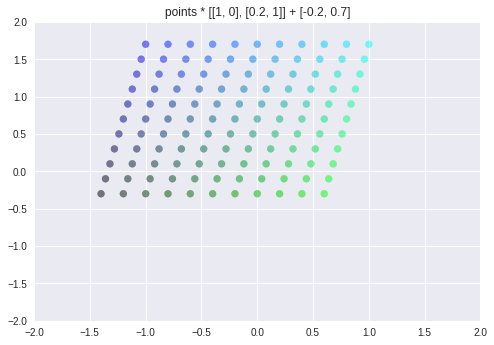

In [0]:
#@title Fully Connected Layer { run: "auto", vertical-output: true }

mat00 = 1 #@param {type:"slider", min:-2, max:2, step:0.1}
mat01 = 0 #@param {type:"slider", min:-2, max:2, step:0.1}
mat10 = 0.2 #@param {type:"slider", min:-2, max:2, step:0.1}
mat11 = 1 #@param {type:"slider", min:-2, max:2, step:0.1}

bias_x = -0.2 #@param {type:"slider", min:-2, max:2, step:0.1}
bias_y = 0.7 #@param {type:"slider", min:-2, max:2, step:0.1}
relu_enabled = False #@param {type:"boolean"}


  
def DrawFullyConnectedLayer(fig, ax, points, mat, bias, relu_enabled):
  
  colors = np.concatenate(
       [
           np.zeros_like(points[:,1:2]),
           points[:,0:1] * 0.5 + 0.5,
           points[:,1:2] * 0.5 + 0.5
       ],
      axis=1)

  points = np.matmul(points, mat) + bias
  if relu_enabled:
    points = np.maximum(points, 0)

  title = "points * %s + %s" % (mat, bias)
  if relu_enabled:
    title = "Relu(%s)" % title
  plt.title(title)
  
  plt.scatter(points[:,0], points[:,1], alpha=0.5, c=colors)
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)
  return fig
  
mat = [[mat00, mat01], [mat10, mat11]]
bias = [bias_x, bias_y]

fig, ax = plt.subplots()
DrawFullyConnectedLayer(
    fig, ax,
    GetPointsOnGrid(),
    mat, bias, relu_enabled)
None

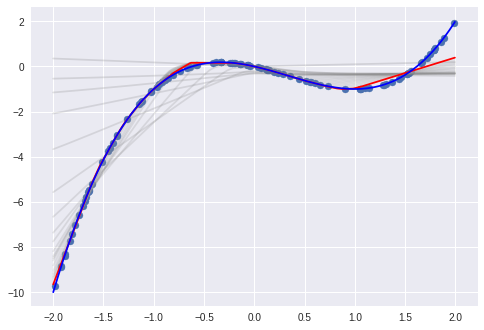

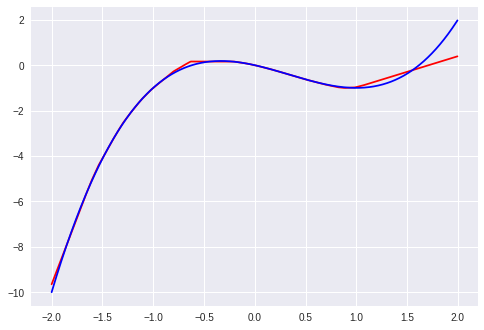

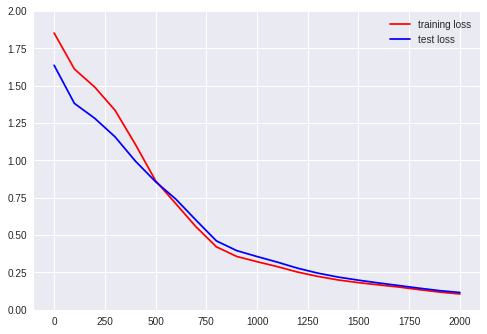

In [0]:
#@title Finding a function to match points with NN { run: "auto" }

from tensorflow.keras import layers

# Saved nice defaults
# log_learning_rate = -3.2  #@param {type:"slider", min:-5, max:0, step:0.1}
# num_examples = 100 #@param ["10", "100", "1000"] {type:"raw"}
# num_nn_layers = 3 #@param {type:"slider", min:1, max:4, step:1}
# add_noise = False #@param {type:"boolean"}
# use_momentum_optimizer = True #@param {type:"boolean"}
# plot_only_loss = False #@param {type:"boolean"}

log_learning_rate = -3.2  #@param {type:"slider", min:-5, max:0, step:0.1}
num_examples = 100 #@param ["10", "100", "1000"] {type:"raw"}
num_nn_layers = 3 #@param {type:"slider", min:0, max:4, step:1}
add_noise = False #@param {type:"boolean"}
use_momentum_optimizer = True #@param {type:"boolean"}
plot_only_loss = False #@param {type:"boolean"}

learning_rate = 10 ** log_learning_rate

def model(x):
  y = x
  if num_nn_layers > 0:
    y = layers.Dense(5, activation=tf.nn.relu)(y)
  # NN can have more than one layer
  if num_nn_layers > 1:
    y = layers.Dense(50, activation=tf.nn.relu)(y)
  if num_nn_layers > 2:
    y = layers.Dense(50, activation=tf.nn.relu)(y)
  if num_nn_layers > 3:
    y = layers.Dense(50, activation=tf.nn.relu)(y)
  y = layers.Dense(1)(y)
  return y

g = tf.Graph()
with g.as_default():
  x = tf.placeholder(name="x", dtype=tf.float32)
  
  y = tf.reshape(x, [-1, 1])
  y = model(y)
  y = tf.reshape(y, [-1])
  
  label = tf.placeholder(name="label", dtype=tf.float32)
  loss = tf.reduce_mean(tf.abs(y - label))

  step = tf.train.get_or_create_global_step()
  if use_momentum_optimizer:
    optimizer = tf.train.MomentumOptimizer(learning_rate=learning_rate, momentum=0.9)
  else:
    optimizer = tf.train.GradientDescentOptimizer(learning_rate=learning_rate)

  training_step = optimizer.minimize(loss, global_step=step)

  
  init = tf.global_variables_initializer()
  sess = tf.Session()

sess.run(init)

def ground_truth_function(x):
  return x ** 3 - x ** 2 - x

eval_at_x = np.arange(-2, 2, 0.004)
# eval_at_x = np.sort(np.random.random(100) * 4 - 2)
eval_ys = ground_truth_function(eval_at_x)
xes = np.sort(np.random.random(num_examples) * 4 - 2)
yes = ground_truth_function(xes)
if add_noise:
  yes = (ground_truth_function(xes + np.random.randn(len(xes)) * 0.1) 
         + np.random.randn(len(yes)) * 0.1)

losses = []
for i in xrange(20, -1, -1):
  if not plot_only_loss:
    c = 0.7 - i / float(50) * 0.7
    plt.plot(
        eval_at_x,
        sess.run(y, feed_dict={x: eval_at_x}),
        color=(c, c, c, 0.2),
    )
  train_loss = sess.run(loss, {
        x: xes,
        label: yes})
  test_loss = sess.run(
      loss, {
        x: eval_at_x,
        label: eval_ys})
  step_v = sess.run(step)
  losses.append((step_v, train_loss, test_loss))
#   print "%d Training loss: %0.3f   Test loss: %0.3f" % (
#     step_v, train_loss, test_loss)
  
  if i > 0:
    for j in xrange(100):
      sess.run(training_step, {
          x: xes,
          label: yes})
if not plot_only_loss:
  plt.scatter(xes, yes)
  plt.plot(
    eval_at_x,
    sess.run(y, feed_dict={x: eval_at_x}),
    c="red")
  plt.plot(
      eval_at_x,
      eval_ys,
      c="blue"
  )
  plt.show()

  plt.plot(
    eval_at_x,
    sess.run(y, feed_dict={x: eval_at_x}),
    c="red")
  plt.plot(
      eval_at_x,
      eval_ys,
      c="blue"
  )
  plt.show()  
  
# Plot loss curves over the time of training
plt.plot(
    [l[0] for l in losses], # step
    [l[1] for l in losses], # train loss
    c="red")
plt.plot(
    [l[0] for l in losses], # step
    [l[2] for l in losses], # test loss
    c="blue")
plt.legend(["training loss", "test loss"])
# plt.xlim(1000, 2000)
# plt.ylim(0, 0.25)
plt.ylim(0, 2)

plt.show()


None


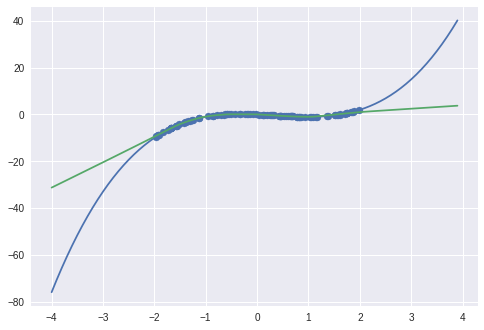

In [0]:
# we were training with x [-2, 2] so NN makes poor guess
# on how the data outside of this range looks like

plt.scatter(xes, yes)
eval_at_x = np.arange(-4, 4, 0.1)
plt.plot(
    eval_at_x,
    ground_truth_function(eval_at_x)
)

plt.plot(
    eval_at_x,
    sess.run(y, feed_dict={x: eval_at_x})
)

# Next: [MNIST - Hello World of ML](https://goo.gl/qmSZbX)




## Resources I recommend:
* Basics of NN:
    * [Neural networks](https://www.youtube.com/playlist?list=PLZHQObOWTQDNU6R1_67000Dx_ZCJB-3pi) by 3Blue1Brown on YouTube
    * Welsch Labs on YouTube
        * [Learning To See](https://www.youtube.com/playlist?list=PLiaHhY2iBX9ihLasvE8BKnS2Xg8AhY6iV)
        * [Neural Networks Demystified](https://www.youtube.com/playlist?list=PLiaHhY2iBX9hdHaRr6b7XevZtgZRa1PoU)
* Courses:
   * [Machine Learning Crash Course with TensorFlow APIs](https://developers.google.com/machine-learning/crash-course/) by Google
   *  [CS231n Winter 2016](https://www.youtube.com/playlist?list=PLkt2uSq6rBVctENoVBg1TpCC7OQi31AlC) by Andrej Karpathy or [by Stanford](http://cs231n.stanford.edu/)
   * Coursera [Machine Learning](https://www.coursera.org/learn/machine-learning) by Andrew Ng
* http://tools.google.com/seedbank - example Colabs by Google
* https://www.tensorflow.org/tutorials

 and MANY more out there...